In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!pip install transformers
!pip install stop_words
!pip install TurkishStemmer
!pip install zeyrek
!python -m spacy download xx_ent_wiki_sm

shell-init: error retrieving current directory: getcwd: cannot access parent directories: Transport endpoint is not connected
shell-init: error retrieving current directory: getcwd: cannot access parent directories: Transport endpoint is not connected
Traceback (most recent call last):
  File "/usr/local/bin/pip3", line 5, in <module>
    from pip._internal.cli.main import main
  File "/usr/local/lib/python3.9/dist-packages/pip/_internal/cli/main.py", line 9, in <module>
    from pip._internal.cli.autocompletion import autocomplete
  File "/usr/local/lib/python3.9/dist-packages/pip/_internal/cli/autocompletion.py", line 10, in <module>
    from pip._internal.cli.main_parser import create_main_parser
  File "/usr/local/lib/python3.9/dist-packages/pip/_internal/cli/main_parser.py", line 8, in <module>
    from pip._internal.cli import cmdoptions
  File "/usr/local/lib/python3.9/dist-packages/pip/_internal/cli/cmdoptions.py", line 23, in <module>
    from pip._internal.cli.parser import C

Necessary Libraries

In [ ]:
import re
import os
import string
import numpy as np
import pandas as pd
# plotting
import seaborn as sns
from wordcloud import WordCloud
import matplotlib.pyplot as plt
# nltk
from nltk.stem import WordNetLemmatizer
import nltk
nltk.download(['punkt', 'stopwords'])
from nltk.tokenize import word_tokenize
from nltk.tokenize import RegexpTokenizer
from nltk.probability import FreqDist
# stopwords-stemming
import spacy
from TurkishStemmer import TurkishStemmer
from nltk.corpus import stopwords
from sklearn import preprocessing
from stop_words import get_stop_words
# sklearn
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, auc
#Counter
from collections import Counter
#transformers
from transformers import AutoModelForSequenceClassification, AutoTokenizer, pipeline

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
os.chdir("/content/drive/MyDrive/Teknofest-Hive Heroes/sentiment_analiz_example/")
STOPWORDS_FILEPATH_opt3 = "data/stopwords_tr.txt"
DATA_PATH="data/teknofest_train_final.xls"

Importing Data

In [ ]:
df = pd.read_csv(DATA_PATH, sep = "|", na_values="99",encoding="utf-8") # utf-8 was used because the dataset contains Turkish characters
df.head(10)

,id,text,is_offensive,target
0,81c11060-a240-4d54-841b-9e2916039e85,çürük dişli,1,INSULT
1,be80ebbf-b322-4c3b-afa1-94932ea80731,Bu adamın islama ve müslümanlara verdiği zarar...,1,RACIST
2,f99e2513-83ed-4076-ac72-b9e2cff3f049,erkekler zora gelmez,1,SEXIST
3,83ed2b2e-b815-4f36-9fc4-80a9050cf2d0,Utanmazın götüne kazık sokmuşlar bu tıkırtı ne...,1,PROFANITY
4,d93e05f7-bfdd-4cdb-99d8-3048761b30ff,otomasyon< sistemlerine= doğrudan bağlanabilir,0,OTHER
5,81eca520-15a0-4f5b-a1dd-5929bba34bdc,amını siktiğimin yarrağı,1,PROFANITY
6,a2497690-5201-4c28-bdb8-4206ea672765,ekipte bir cücemiz eksikti o da oldu,1,INSULT
7,b9122be9-5a9a-491e-8ecc-998ac05c6ef0,Kadın yönetici sayısı oldukça az olduğu için ş...,1,SEXIST
8,2dd1b0d1-45cd-4d4a-86c3-b290db5a0316,makara bunu duyunca avluya çıkmış ve kızağa sa...,0,OTHER
9,d7781fd9-ee64-4b51-9abd-aa8eda638230,hay ebenin pembe patiğine sıçayım bok kafalı,1,PROFANITY


In [ ]:
df.tail()

,id,text,is_offensive,target
12612,71eedfa1-8fa6-425c-b982-258c3b29c003,uyuma taklidi yapan tehlikeli bir hayvanın göz...,0,OTHER
12613,b38eed16-6501-4563-8b33-ff2e634bb8e5,yolda at kavga eden üç oğlan çocuğu görür,0,OTHER
12614,c8a051a8-94ef-4b64-a48e-54d0fa4f8323,sizin köpeklerinizin burnu bile daha iyi koku ...,0,OTHER
12615,513a7e6d-4207-4a16-9b47-972f26e23cfe,hayalleri gerçek etmek için birisinin delilik ...,0,OTHER
12616,247834c9-ad37-4576-a094-69d70c69b124,deliklerden birini bulsan diğerini bulamıyorsu...,0,OTHER


Some info about data

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12617 entries, 0 to 12616
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   id            12617 non-null  object
 1   text          12617 non-null  object
 2   is_offensive  12617 non-null  int64 
 3   target        12617 non-null  object
dtypes: int64(1), object(3)
memory usage: 394.4+ KB


In [ ]:
target_values = df['target'].value_counts()
target_values

OTHER        3616
INSULT       2419
PROFANITY    2398
SEXIST       2112
RACIST       2072
Name: target, dtype: int64

In [ ]:
target_values = df['is_offensive'].value_counts()
target_values

1    9018
0    3599
Name: is_offensive, dtype: int64

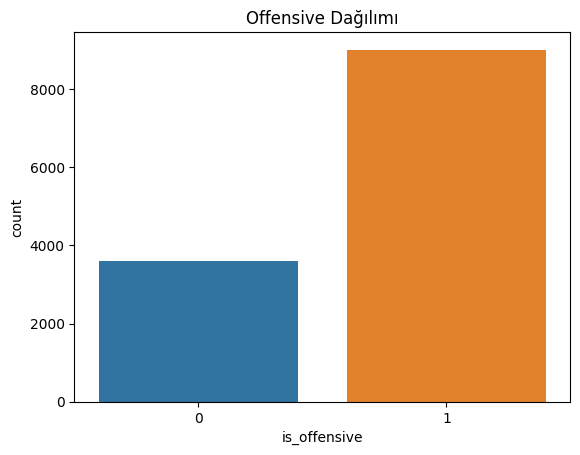

In [ ]:
sns.countplot(x='is_offensive', data=df)
plt.title('Offensive Dağılımı')
plt.show()

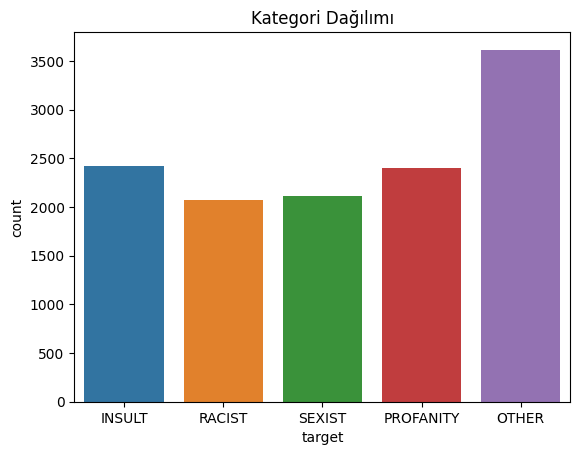

In [ ]:
sns.countplot(x='target', data=df)
plt.title('Kategori Dağılımı')
plt.show()

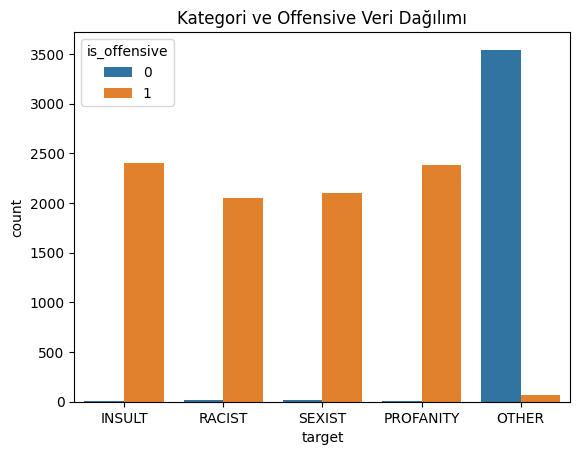

In [ ]:
sns.countplot(x='target', hue='is_offensive', data=df)
plt.title('Kategori ve Offensive Veri Dağılımı')
plt.show()

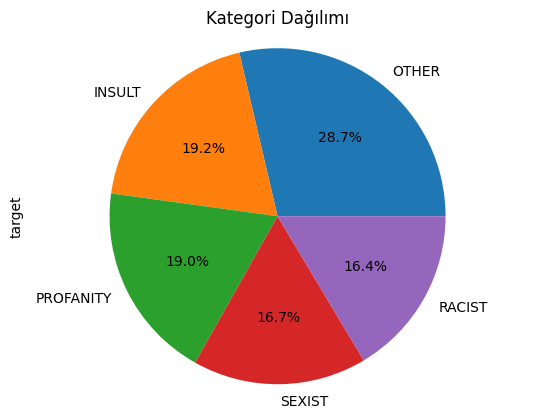

In [ ]:
df['target'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.axis('equal')
plt.title('Kategori Dağılımı')
plt.show()

In [ ]:
counts = df.groupby(['target', 'is_offensive']).size()
print(counts)

target     is_offensive
INSULT     0                 12
           1               2407
OTHER      0               3544
           1                 72
PROFANITY  0                 12
           1               2386
RACIST     0                 18
           1               2054
SEXIST     0                 13
           1               2099
dtype: int64


##Preprocess Part

Delete values ​​with a character length of one



In [ ]:
df['text']

0                                              çürük dişli
1        Bu adamın islama ve müslümanlara verdiği zarar...
2                                     erkekler zora gelmez
3        Utanmazın götüne kazık sokmuşlar bu tıkırtı ne...
4           otomasyon< sistemlerine= doğrudan bağlanabilir
                               ...                        
12612    uyuma taklidi yapan tehlikeli bir hayvanın göz...
12613            yolda at kavga eden üç oğlan çocuğu görür
12614    sizin köpeklerinizin burnu bile daha iyi koku ...
12615    hayalleri gerçek etmek için birisinin delilik ...
12616    deliklerden birini bulsan diğerini bulamıyorsu...
Name: text, Length: 12617, dtype: object

In [ ]:
def get_single_character_elements(text):
    single_char_elements = []
    for element in text:
        if len(element) == 1:
            single_char_elements.append(element)
    return single_char_elements

In [ ]:
def remove_short_strings(df:pd.DataFrame, string_column:str)->pd.DataFrame:
    df[string_column] = df[string_column].astype(str)
    df['length'] = df[string_column].str.len()
    df = df.drop(df[df['length'] == 1].index)
    df = df.drop(columns=['length'])
    return df

In [ ]:
def remove_one_character_words(row):
    words = row['text'].split()
    return ' '.join([word for word in words if len(word) > 1])
df['text'] = df.apply(remove_one_character_words, axis=1)

In [ ]:
def ret_list_to_str(liste):
  return " ".join (i for i in liste)

In [ ]:
def preprocess_tweet(tweet):
    tweet = tweet.lower() # Convert to lower case
    tweet = re.sub(r'(.)\1+', r'\1\1', tweet) # Replace repeating characters
    tweet = re.sub(r'[^a-zA-ZçÇğĞıİöÖşŞüÜ\s]', '', tweet) # Remove non-Turkish characters
    tweet = re.sub(r'\s+', ' ', tweet).strip() # Remove extra whitespaces
    return tweet

In [ ]:
def cleaning_stopwords(text,stop_words):
    return " ".join([word for word in str(text).split() if word not in stop_words])

### Tokenization

In [ ]:
import spacy
nlp = spacy.load('xx_ent_wiki_sm')
def tokenizer_spacy(text):
  doc = nlp(text)
  # Generate the tokens
  tokens = [token.text for token in doc if len(token.text) != 1]
  return tokens

### Lemmatization

In [ ]:
def lemmatize_text(words):
  global unknown_trlemma_words
  stemmer = TurkishStemmer()
  unknown_trlemma_words=[]
  lemmatized_words = []
  for word in words:
      lemmatized_word = stemmer.stem(word)
      #if lemmatized_word== "Unk":
      #  unknown_trlemma_words.append(word)
      #  print("Bulunamadı", word)
      #else:
      lemmatized_words.append(lemmatized_word)
  return lemmatized_words

### Removing Stopwords

Shown 3 different Turkish stopwords lists and use the most appropriate one for the dataset



In [ ]:
turkish_stopwords = stopwords.words('turkish') # from nltk stopwords 
#turkish_stopwords.append("bir")
#turkish_stopwords=set(turkish_stopwords) #length:54

stop_words = get_stop_words('turkish') # from get_stopwords, length:114
#turkish_stopwords
#stop_words

In [ ]:
df

,id,text,is_offensive,target
0,81c11060-a240-4d54-841b-9e2916039e85,çürük dişli,1,INSULT
1,be80ebbf-b322-4c3b-afa1-94932ea80731,Bu adamın islama ve müslümanlara verdiği zarar...,1,RACIST
2,f99e2513-83ed-4076-ac72-b9e2cff3f049,erkekler zora gelmez,1,SEXIST
3,83ed2b2e-b815-4f36-9fc4-80a9050cf2d0,Utanmazın götüne kazık sokmuşlar bu tıkırtı ne...,1,PROFANITY
4,d93e05f7-bfdd-4cdb-99d8-3048761b30ff,otomasyon< sistemlerine= doğrudan bağlanabilir,0,OTHER
...,...,...,...,...
12612,71eedfa1-8fa6-425c-b982-258c3b29c003,uyuma taklidi yapan tehlikeli bir hayvanın göz...,0,OTHER
12613,b38eed16-6501-4563-8b33-ff2e634bb8e5,yolda at kavga eden üç oğlan çocuğu görür,0,OTHER
12614,c8a051a8-94ef-4b64-a48e-54d0fa4f8323,sizin köpeklerinizin burnu bile daha iyi koku ...,0,OTHER
12615,513a7e6d-4207-4a16-9b47-972f26e23cfe,hayalleri gerçek etmek için birisinin delilik ...,0,OTHER


In [ ]:
def prep_and_sw_and_tokenize(df,opt_sw,opt_tokenize,opt_lemma):
  le = preprocessing.LabelEncoder()
  le.fit(["OTHER", "INSULT", "SEXIST", "PROFANITY","RACIST"])
  df["y_target_number"]=le.transform(df["target"])
  df["preprocessed_text"]=df["text"].apply(preprocess_tweet)
  if opt_sw==1:
    stop_words = stopwords.words('turkish')
    stop_words.append("bir")
    stop_words=set(turkish_stopwords)
  elif opt_sw==2:
    stop_words = get_stop_words('turkish')
  df['first_p_sec_sw'] = df["preprocessed_text"].apply(lambda text: cleaning_stopwords(text,stop_words))
  if opt_tokenize==0:
    df["tkn_p_sw"]=df["first_p_sec_sw"].apply(tokenizer_spacy)
  elif opt_tokenize==0:
    df["tkn_p_sw"]=[word_tokenize(i,language='turkish') for i in df["first_p_sec_sw"]]
  if opt_lemma==0:
    df["str_tkn_p_sw"]=df['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
  elif opt_lemma==1:
    df['lemma_tokenized_swp'] = df["tkn_p_sw"].apply(lemmatize_text)
    df['str_lemma_tokenized_swp']=df['lemma_tokenized_swp'].apply(lambda text: ret_list_to_str(text))
  return df

In [ ]:
data =prep_and_sw_and_tokenize(df=df,opt_sw=1,opt_tokenize=0,opt_lemma=0)
data

,id,text,is_offensive,target,y_target_number,preprocessed_text,first_p_sec_sw,tkn_p_sw,str_tkn_p_sw
0,81c11060-a240-4d54-841b-9e2916039e85,çürük dişli,1,INSULT,0,çürük dişli,çürük dişli,"[çürük, dişli]",çürük dişli
1,be80ebbf-b322-4c3b-afa1-94932ea80731,Bu adamın islama ve müslümanlara verdiği zarar...,1,RACIST,3,bu adamın islama ve müslümanlara verdiği zarar...,adamın islama müslümanlara verdiği zararı gavu...,"[adamın, islama, müslümanlara, verdiği, zararı...",adamın islama müslümanlara verdiği zararı gavu...
2,f99e2513-83ed-4076-ac72-b9e2cff3f049,erkekler zora gelmez,1,SEXIST,4,erkekler zora gelmez,erkekler zora gelmez,"[erkekler, zora, gelmez]",erkekler zora gelmez
3,83ed2b2e-b815-4f36-9fc4-80a9050cf2d0,Utanmazın götüne kazık sokmuşlar bu tıkırtı ne...,1,PROFANITY,2,utanmazın götüne kazık sokmuşlar bu tıkırtı ne...,utanmazın götüne kazık sokmuşlar tıkırtı nered...,"[utanmazın, götüne, kazık, sokmuşlar, tıkırtı,...",utanmazın götüne kazık sokmuşlar tıkırtı nered...
4,d93e05f7-bfdd-4cdb-99d8-3048761b30ff,otomasyon< sistemlerine= doğrudan bağlanabilir,0,OTHER,1,otomasyon sistemlerine doğrudan bağlanabilir,otomasyon sistemlerine doğrudan bağlanabilir,"[otomasyon, sistemlerine, doğrudan, bağlanabilir]",otomasyon sistemlerine doğrudan bağlanabilir
...,...,...,...,...,...,...,...,...,...
12612,71eedfa1-8fa6-425c-b982-258c3b29c003,uyuma taklidi yapan tehlikeli bir hayvanın göz...,0,OTHER,1,uyuma taklidi yapan tehlikeli bir hayvanın göz...,uyuma taklidi yapan tehlikeli bir hayvanın göz...,"[uyuma, taklidi, yapan, tehlikeli, bir, hayvan...",uyuma taklidi yapan tehlikeli bir hayvanın göz...
12613,b38eed16-6501-4563-8b33-ff2e634bb8e5,yolda at kavga eden üç oğlan çocuğu görür,0,OTHER,1,yolda at kavga eden üç oğlan çocuğu görür,yolda at kavga eden üç oğlan çocuğu görür,"[yolda, at, kavga, eden, üç, oğlan, çocuğu, gö...",yolda at kavga eden üç oğlan çocuğu görür
12614,c8a051a8-94ef-4b64-a48e-54d0fa4f8323,sizin köpeklerinizin burnu bile daha iyi koku ...,0,OTHER,1,sizin köpeklerinizin burnu bile daha iyi koku ...,sizin köpeklerinizin burnu bile iyi koku alıyo...,"[sizin, köpeklerinizin, burnu, bile, iyi, koku...",sizin köpeklerinizin burnu bile iyi koku alıyo...
12615,513a7e6d-4207-4a16-9b47-972f26e23cfe,hayalleri gerçek etmek için birisinin delilik ...,0,OTHER,1,hayalleri gerçek etmek için birisinin delilik ...,hayalleri gerçek etmek birisinin delilik yapma...,"[hayalleri, gerçek, etmek, birisinin, delilik,...",hayalleri gerçek etmek birisinin delilik yapma...


In [ ]:
data.to_csv('train_with_preprocess_nolemma.csv', index=False)

## Exploratory Data Analysis

In [ ]:
counts = df.groupby(['target', 'is_offensive']).size()
print(counts)

target     is_offensive
INSULT     0                 12
           1               2407
OTHER      0               3544
           1                 72
PROFANITY  0                 12
           1               2386
RACIST     0                 18
           1               2054
SEXIST     0                 13
           1               2099
dtype: int64


In [ ]:
subset_df = df[(df['target'] == 'OTHER') & (df['is_offensive'] == 1)]
subset_df

,id,text,is_offensive,target,y_target_number,preprocessed_text,first_p_sec_sw,tkn_p_sw,str_tkn_p_sw
259,101de688-231c-463a-b614-842a994d7ef8,Bana adımın ne olduğunu sordu,1,OTHER,1,bana adımın ne olduğunu sordu,bana adımın olduğunu sordu,"[bana, adımın, olduğunu, sordu]",bana adımın olduğunu sordu
315,15beb953-c6d6-4c4c-b0b2-37015dc5c09b,Bile bile aşka kafa tutuyor.,1,OTHER,1,bile bile aşka kafa tutuyor,bile bile aşka kafa tutuyor,"[bile, bile, aşka, kafa, tutuyor]",bile bile aşka kafa tutuyor
597,626e67f2-8a8f-4046-9452-8367786db1f6,Mevsimsel geçişlerde hasta olmak kaçınılmaz ol...,1,OTHER,1,mevsimsel geçişlerde hasta olmak kaçınılmaz ol...,mevsimsel geçişlerde hasta olmak kaçınılmaz ol...,"[mevsimsel, geçişlerde, hasta, olmak, kaçınılm...",mevsimsel geçişlerde hasta olmak kaçınılmaz ol...
675,9ecdda9c-5e47-4470-9824-0dce8068f75d,Her ne kadar kabullenmesen de bu iş böyle yapı...,1,OTHER,1,her ne kadar kabullenmesen de bu iş böyle yapılır,kadar kabullenmesen iş böyle yapılır,"[kadar, kabullenmesen, iş, böyle, yapılır]",kadar kabullenmesen iş böyle yapılır
733,0c2ebd1e-1790-48f4-8df0-e2a5e98fca2c,Derslerimi seçtim.,1,OTHER,1,derslerimi seçtim,derslerimi seçtim,"[derslerimi, seçtim]",derslerimi seçtim
...,...,...,...,...,...,...,...,...,...
12449,f70d44a8-d94b-40ec-bccb-9d74a0d49fa9,,1,OTHER,1,,,[],
12458,89974741-466e-4161-87e4-8b19e0a33cfc,,1,OTHER,1,,,[],
12464,7154b1e1-56b6-4922-99a2-7780b033b380,,1,OTHER,1,,,[],
12469,41343b71-ee09-469c-b289-82f1e97f10eb,,1,OTHER,1,,,[],


In [ ]:
deneme=df[df['text'].str.contains("sen", case=False)]
deneme_off=deneme[deneme['is_offensive']==0]
print(len(deneme_off),len(deneme))

60 1430


## Visualization

For using later, added word cloud function

Group data by categories

In [ ]:
data_pos = df[df['is_offensive'] == 0] 
data_neg = df[df['is_offensive'] == 1]

data_insult=df[df['target'] == "INSULT"]
data_profanity=df[df['target'] == "RACIST"]
data_sexist=df[df['target'] == "SEXIST"]
data_racist=df[df['target'] ==  "PROFANITY"]
data_other=df[df['target'] == "OTHER"]

In [ ]:
data_neg

,id,text,is_offensive,target,y_target_number,preprocessed_text,first_p_sec_sw,tkn_p_sw,str_tkn_p_sw
0,81c11060-a240-4d54-841b-9e2916039e85,çürük dişli,1,INSULT,0,çürük dişli,çürük dişli,"[çürük, dişli]",çürük dişli
1,be80ebbf-b322-4c3b-afa1-94932ea80731,Bu adamın islama ve müslümanlara verdiği zarar...,1,RACIST,3,bu adamın islama ve müslümanlara verdiği zarar...,adamın islama müslümanlara verdiği zararı gavu...,"[adamın, islama, müslümanlara, verdiği, zararı...",adamın islama müslümanlara verdiği zararı gavu...
2,f99e2513-83ed-4076-ac72-b9e2cff3f049,erkekler zora gelmez,1,SEXIST,4,erkekler zora gelmez,erkekler zora gelmez,"[erkekler, zora, gelmez]",erkekler zora gelmez
3,83ed2b2e-b815-4f36-9fc4-80a9050cf2d0,Utanmazın götüne kazık sokmuşlar bu tıkırtı ne...,1,PROFANITY,2,utanmazın götüne kazık sokmuşlar bu tıkırtı ne...,utanmazın götüne kazık sokmuşlar tıkırtı nered...,"[utanmazın, götüne, kazık, sokmuşlar, tıkırtı,...",utanmazın götüne kazık sokmuşlar tıkırtı nered...
5,81eca520-15a0-4f5b-a1dd-5929bba34bdc,amını siktiğimin yarrağı,1,PROFANITY,2,amını siktiğimin yarrağı,amını siktiğimin yarrağı,"[amını, siktiğimin, yarrağı]",amını siktiğimin yarrağı
...,...,...,...,...,...,...,...,...,...
12480,d6353f79-2e9d-4e7a-9d14-fa1fb23579c6,,1,RACIST,3,,,[],
12481,1e3063ad-00c8-4778-9c2a-c8d5bed3cbec,,1,INSULT,0,,,[],
12485,65ca945d-15af-4d59-8d7d-b731578e45d8,,1,PROFANITY,2,,,[],
12487,6d93aea2-8130-4168-81ea-bd8557ce3272,,1,OTHER,1,,,[],


In [ ]:
data_neg["str_tweet"]=data_neg['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))

<ipython-input-34-1bdfb165f39a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_neg["str_tweet"]=data_neg['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))


In [ ]:
data_neg= data_neg["str_tweet"]

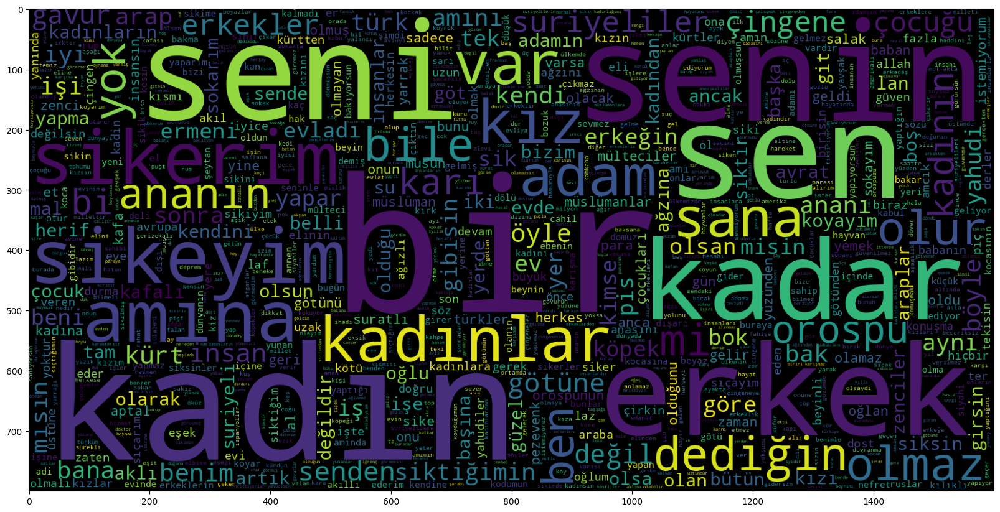

In [ ]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_neg))
plt.imshow(wc)


In [37]:
data_pos =df[df['is_offensive'] == 0]
data_pos["str_tweet"]=data_pos['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
data_pos= data_pos["str_tweet"]

<ipython-input-37-30ca560e5ff5>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_pos["str_tweet"]=data_pos['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))


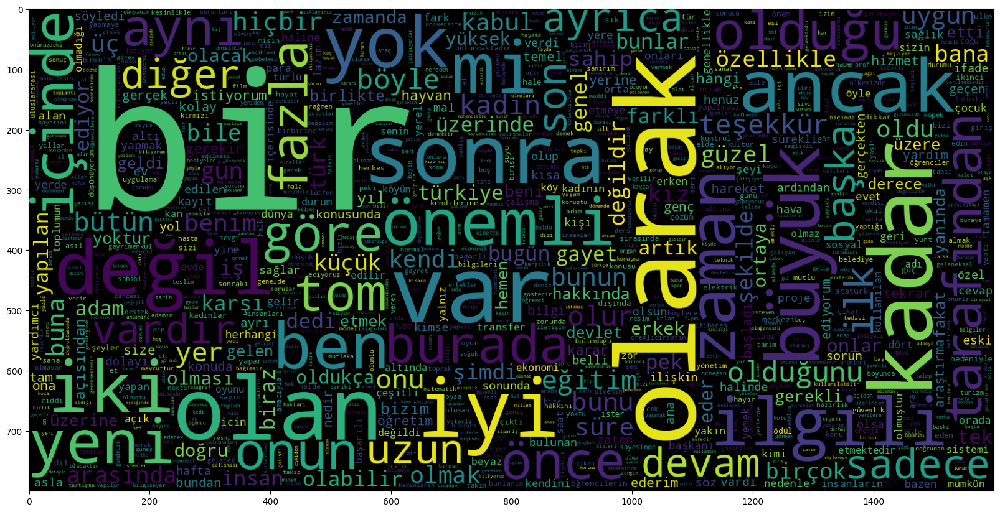

In [38]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_pos))
plt.imshow(wc)


In [42]:
data_other =df[df['target'] == 'OTHER'] 
data_other["str_tweet"]=data_other['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
data_other= data_other["str_tweet"]
tweet_all_texts_other = word_tokenize(" ".join(t for t in data_other))


data_insultant =df[df['target'] == 'INSULT'] 
data_insultant["str_tweet"]=data_insultant['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
data_insultant= data_insultant["str_tweet"]
tweet_all_texts_insultant = word_tokenize(" ".join(t for t in data_insultant))

data_profanity =df[df['target'] == 'PROFANITY'] 
data_profanity["str_tweet"]=data_profanity['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
data_profanity= data_profanity["str_tweet"]
tweet_all_texts_profanity = word_tokenize(" ".join(t for t in data_profanity))


data_racist =df[df['target'] == 'RACIST'] 
data_racist["str_tweet"]=data_racist['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
data_racist= data_racist["str_tweet"]
tweet_all_texts_racisy = word_tokenize(" ".join(t for t in data_racist))

data_sexist =df[df['target'] == 'SEXIST'] 
data_sexist["str_tweet"]=data_sexist['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
data_sexist= data_sexist["str_tweet"]
tweet_all_texts_sexist = word_tokenize(" ".join(t for t in data_sexist))


<ipython-input-42-8a637365e629>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_other["str_tweet"]=data_other['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
<ipython-input-42-8a637365e629>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_insultant["str_tweet"]=data_insultant['tkn_p_sw'].apply(lambda text: ret_list_to_str(text))
<ipython-input-42-8a637365e629>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_index

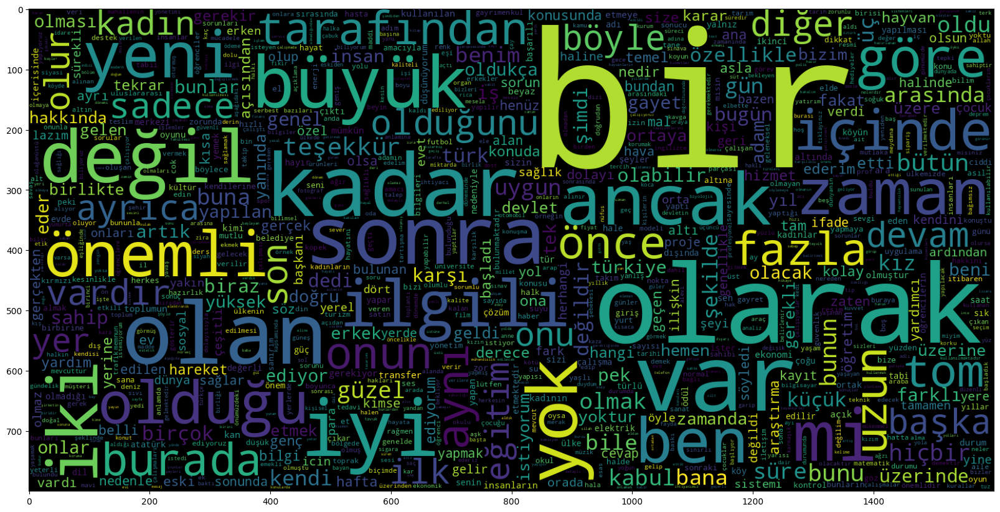

In [43]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_other))
plt.imshow(wc)

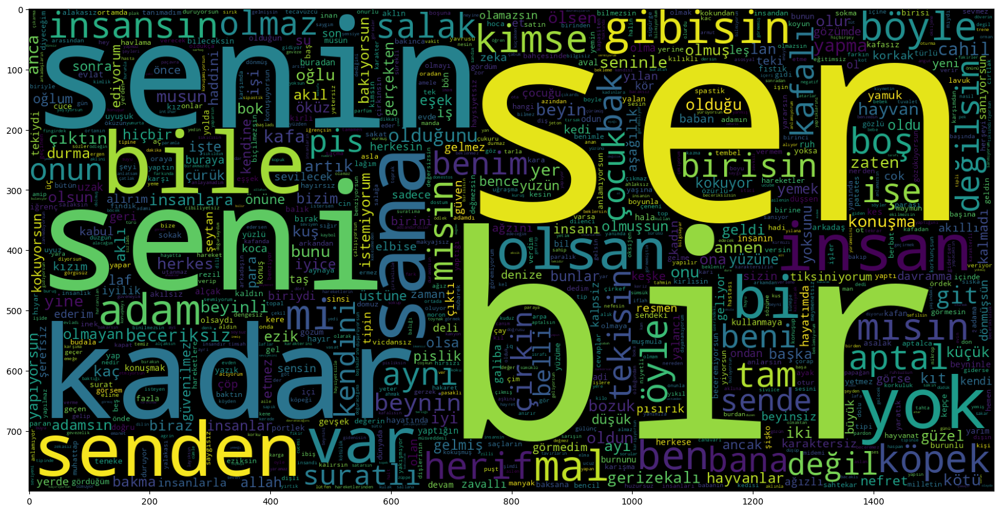

In [44]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_insultant))
plt.imshow(wc)

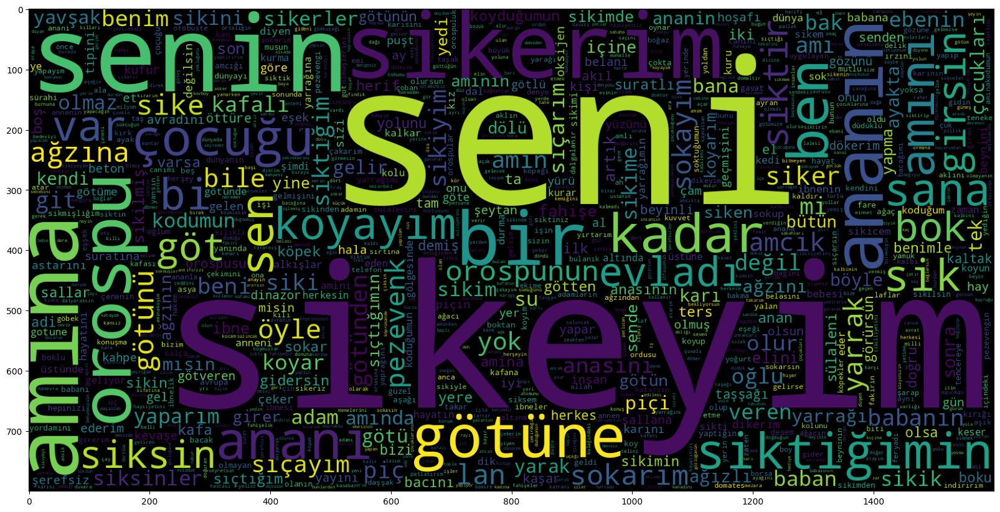

In [45]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_profanity))
plt.imshow(wc)

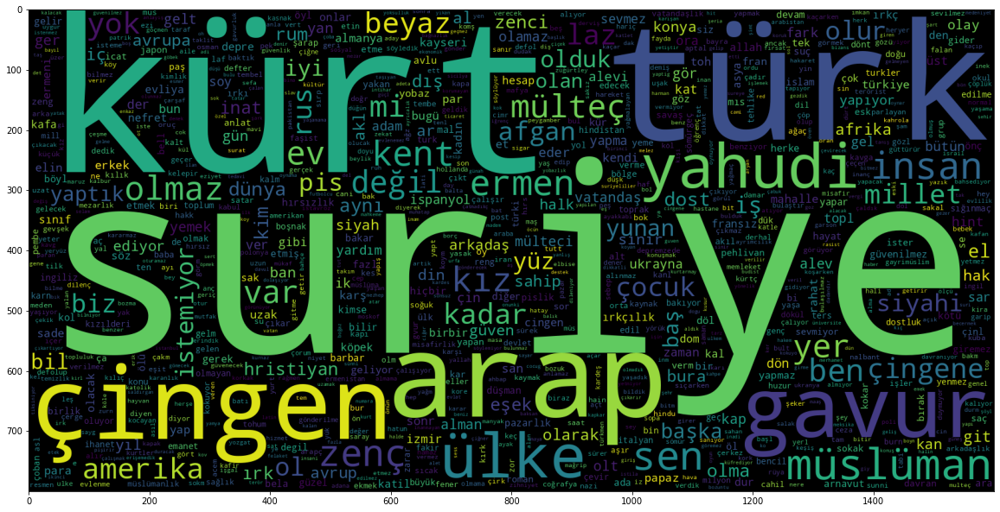

In [ ]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_racist))
plt.imshow(wc)


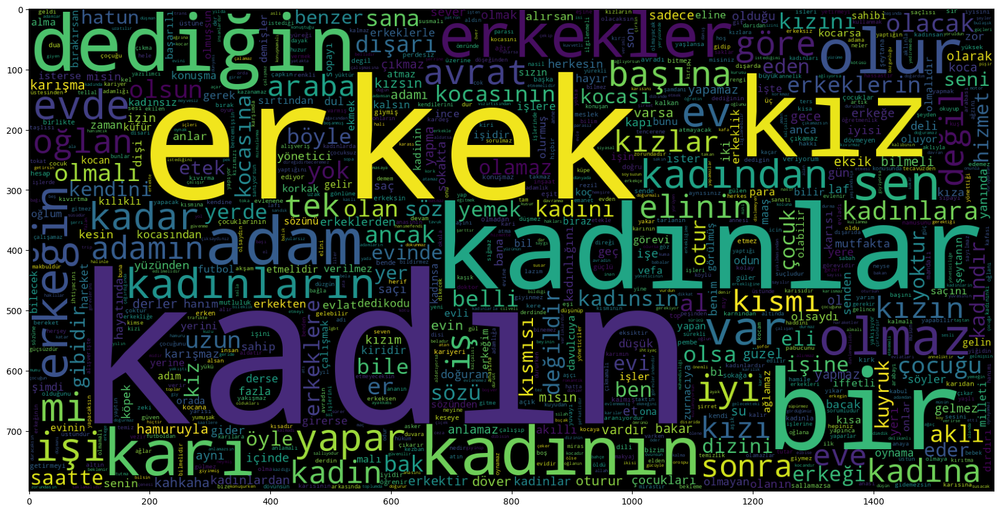

In [46]:
plt.figure(figsize = (20,20))
wc = WordCloud(max_words = 1000 , width = 1600 , height = 800,
               collocations=False).generate(" ".join(data_sexist))
plt.imshow(wc)

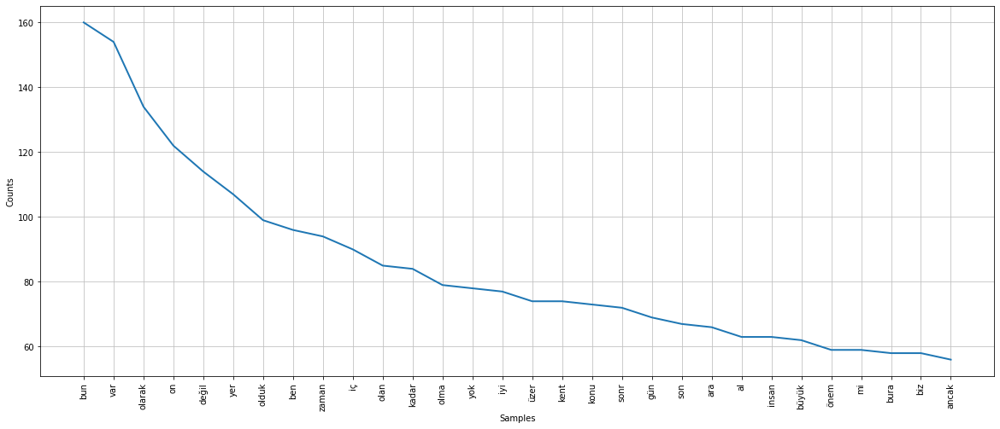

<Axes: xlabel='Samples', ylabel='Counts'>

In [ ]:
fdist_filtered_other = FreqDist(tweet_all_texts_other)
plt.figure(figsize=(20, 8))
fdist_filtered_other.plot(30)


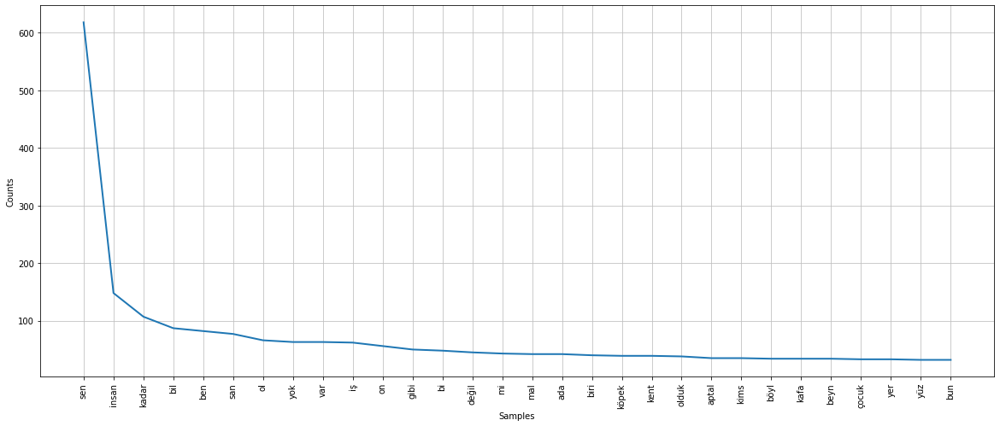

<Axes: xlabel='Samples', ylabel='Counts'>

In [ ]:
fdist_filtered_insultant = FreqDist(tweet_all_texts_insultant)
plt.figure(figsize=(20, 8))
#fdist_filtered_positive.plot(30,title='POSITIVE - Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
fdist_filtered_insultant.plot(30)

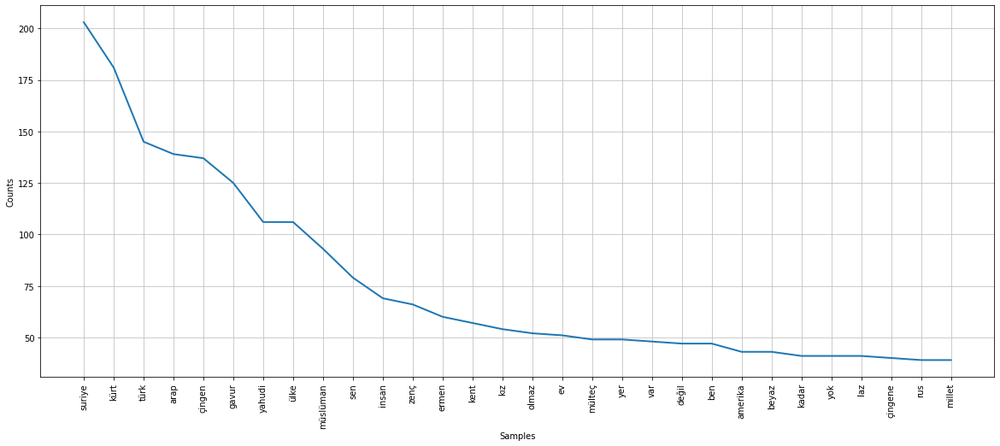

<Axes: xlabel='Samples', ylabel='Counts'>

In [ ]:
fdist_filtered_racist = FreqDist(tweet_all_texts_racisy)
plt.figure(figsize=(20, 8))
#fdist_filtered_positive.plot(30,title='POSITIVE - Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
fdist_filtered_racist.plot(30)

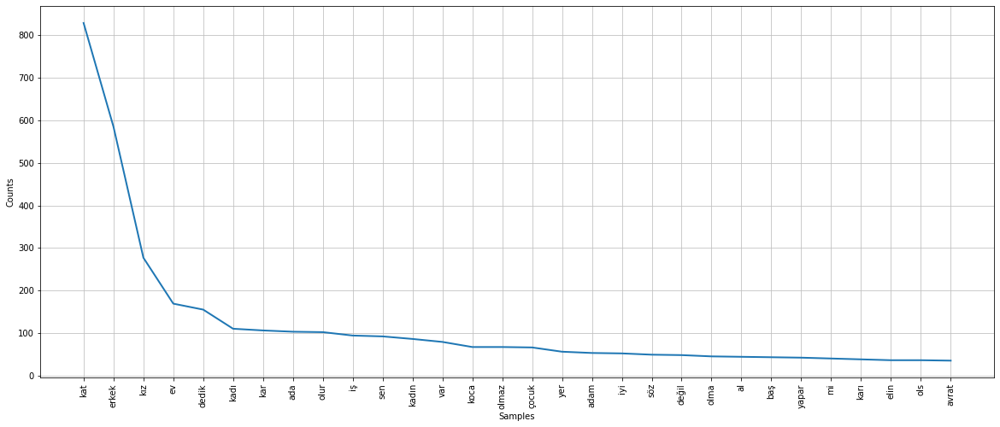

<Axes: xlabel='Samples', ylabel='Counts'>

In [ ]:
fdist_filtered_sexist = FreqDist(tweet_all_texts_sexist)
plt.figure(figsize=(20, 8))
#fdist_filtered_positive.plot(30,title='POSITIVE - Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
fdist_filtered_sexist.plot(30)

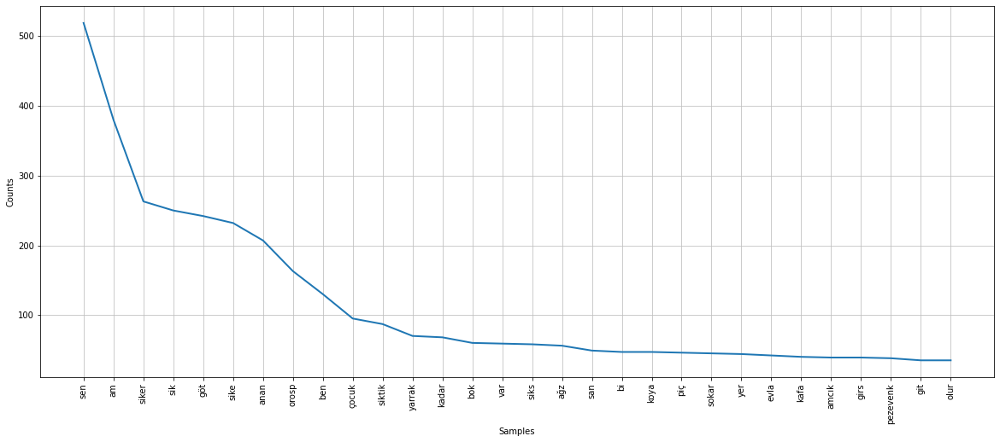

<Axes: xlabel='Samples', ylabel='Counts'>

In [ ]:
fdist_filtered_profanity = FreqDist(tweet_all_texts_profanity)
plt.figure(figsize=(20, 8))
#fdist_filtered_positive.plot(30,title='POSITIVE - Frequency distribution for 30 most common tokens in our text collection (excluding stopwords and punctuation)')
fdist_filtered_profanity.plot(30)